In [1]:
%load_ext autoreload
%autoreload 2
%aimport -taskloaf
import sys
sys.path.append('../common')

In [2]:
import os

import pandas
import numpy as np
import matplotlib.pyplot as plt
import scipy.spatial

import collect_dem
import mesh_fncs
import inverse_tools

from tectosaur.mesh.combined_mesh import CombinedMesh

In [3]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams['text.usetex'] = True
plt.rcParams['font.size'] = 20
plt.rcParams['axes.labelsize'] = 18
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['xtick.labelsize'] = 16
plt.rcParams['ytick.labelsize'] = 16
plt.rcParams['legend.fontsize'] = 20
plt.rcParams['figure.titlesize'] = 22
plt.rcParams['text.latex.preamble'] = '\\usepackage{amsmath}'

In [4]:
zoom = 5
n_dem_interp_pts = 300
proj = 'utm11S'

In [5]:
# Some of the GPS velocities in the Hudnut paper don't
# have corresponding location (Lat, Lon) data, so I removed those from the data set
# I don't include the trilateration data.
data = pandas.read_csv('gpsvels/hudnutgps', sep = ' ')
data['SN'] = data['N']
data['EW'] = data['E']

In [6]:
proj_pts = collect_dem.project(np.array(data['Lon']), np.array(data['Lat']), 0 * np.array(data['Lat']), proj)
data['X'] = proj_pts[:,0]
data['Y'] = proj_pts[:,1]

11S


In [7]:
fault_data = open('landers_fault', 'r').read()

rows = fault_data.split('\n')
raw_fault_segs = []
for r in rows:
    if len(r) == 0:
        continue
    cols = r.split(' ')
    segment_name = ''
    for c_idx in range(len(cols)):
        if cols[c_idx][0].isalpha():
            segment_name += cols[c_idx] + ' '
        else:
            break
    lat = float(cols[c_idx])
    lon = float(cols[c_idx + 1])
    length_km = float(cols[c_idx + 2])
    azimuth_deg_ccw_from_east = float(cols[c_idx + 3])
    slip_cm = float(cols[c_idx + 4])
    raw_fault_segs.append((segment_name, lat, lon, length_km, azimuth_deg_ccw_from_east, slip_cm))

In [8]:
from pyproj import Geod
g = Geod(ellps = 'WGS84')
fault_edges = []
for s in raw_fault_segs:
    center_lat = s[1]
    center_lon = s[2]
    length_m = 0.5 * s[3] * 1000
    az_from_n = -90 - s[4]
    start_lon, start_lat, back_az = g.fwd(center_lon, center_lat, az_from_n, -length_m)
    end_lon, end_lat, back_az = g.fwd(center_lon, center_lat, az_from_n, length_m)
    fault_edges.append(np.array([[start_lat, start_lon], [end_lat, end_lon]]))
fault_edges = np.array(fault_edges)

In [9]:
pts = np.fliplr(fault_edges.reshape((-1, 2)))
els = np.arange(pts.shape[0]).reshape((-1, 2))
m = (pts, els)

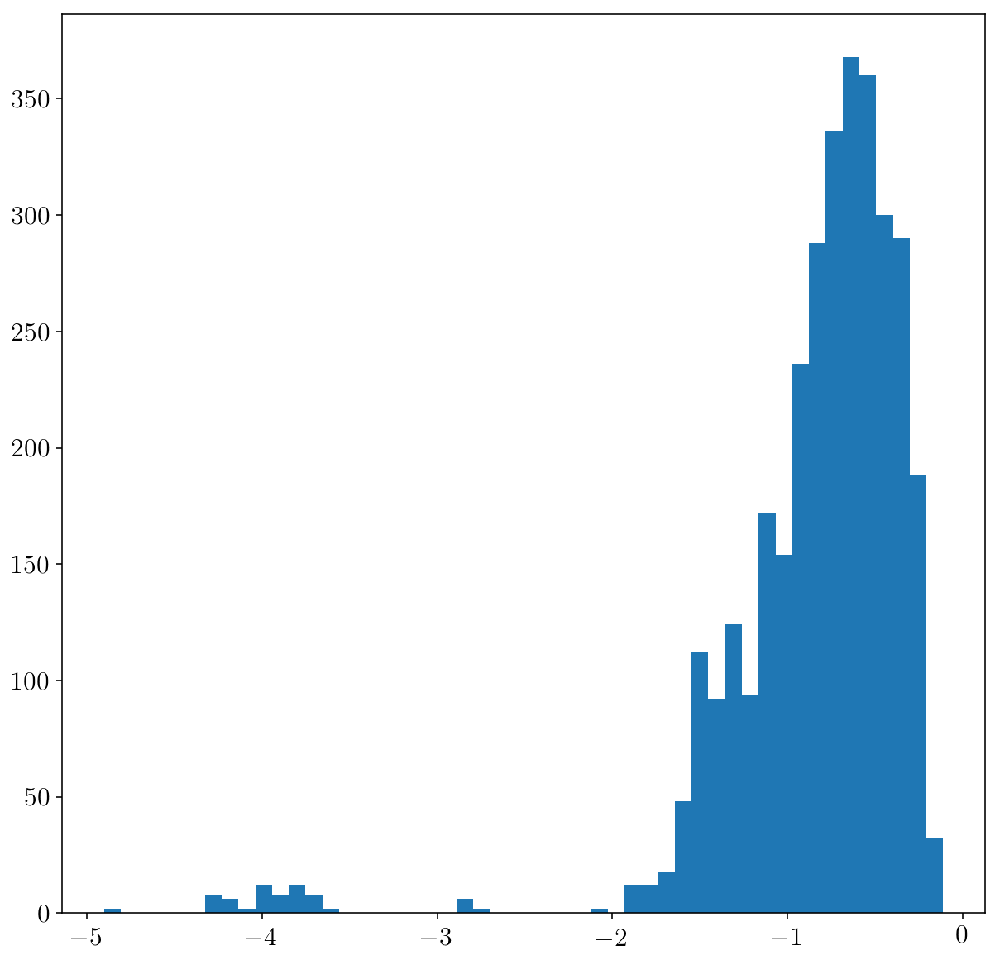

In [10]:
import scipy.spatial.distance
def plot_distance_distribution(m):
    dist = scipy.spatial.distance.cdist(m[0], m[0])
    %matplotlib inline
    plt.figure(figsize = (10,10))
    plt.hist(np.log10(np.abs(dist[dist > 0])), bins = 50)
    plt.show()
plot_distance_distribution(m)

number of remaining pts: 31


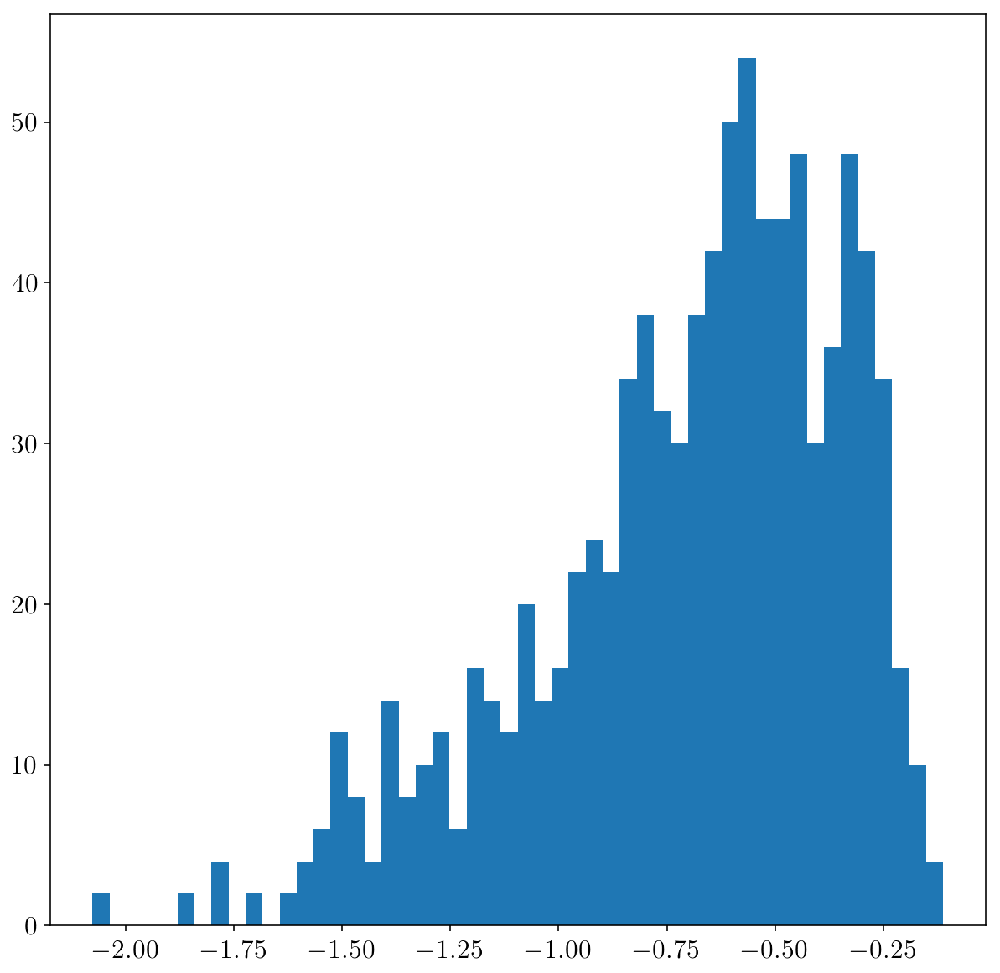

In [11]:
from tectosaur.mesh.modify import remove_duplicate_pts
m_combined = remove_duplicate_pts(remove_duplicate_pts((pts, els), 6e-3), 5e-3)
print('number of remaining pts: ' + str(m_combined[0].shape[0]))
plot_distance_distribution(m_combined)

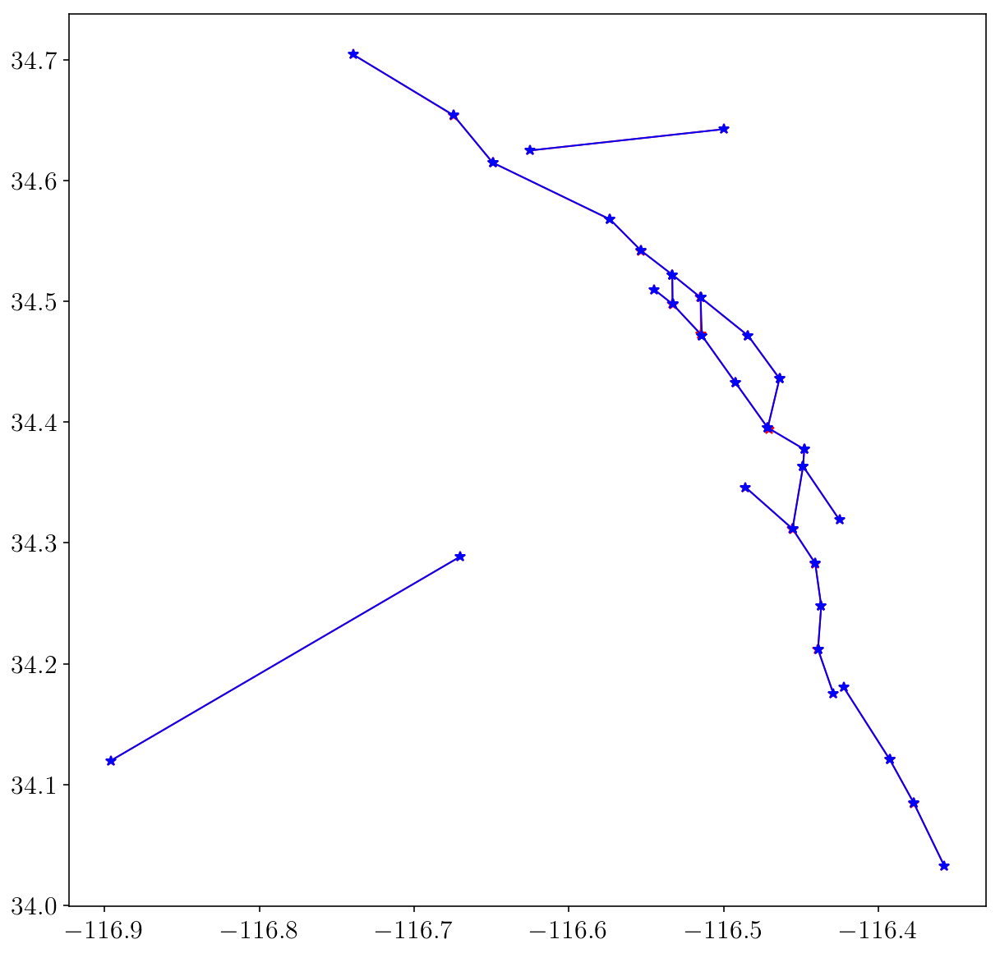

In [12]:
%matplotlib inline
plt.figure(figsize = (10, 10))
for plot_mesh, color in [(m, 'r'), (m_combined, 'b')]:
    for i in range(plot_mesh[1].shape[0]):
        el_pts = plot_mesh[0][plot_mesh[1][i,:]]
        plt.plot(el_pts[:,0], el_pts[:,1], color + '-*', linewidth = 1.0)
plt.show()

In [13]:
def refine_to_size2d(m, threshold):
    pts, els = m
    new_pts = pts.tolist()
    new_els = []
    for i, e in enumerate(els):
        e_pts = pts[e]
        L = np.sqrt(np.sum((e_pts[1,:] - e_pts[0,:]) ** 2))
        split_factor = int(np.ceil(L / threshold))
        xhats = np.linspace(0.0, 1.0, split_factor + 1)
        pts_to_add = (e_pts[0,:,np.newaxis] * (1 - xhats[1:-1]) + e_pts[1,:,np.newaxis] * xhats[1:-1]).T
        start_idx = len(new_pts)
        new_pts.extend(pts_to_add.tolist())
        for i in range(split_factor):
            left_idx = e[0] if i == 0 else start_idx + i - 1
            right_idx = e[1] if i == split_factor - 1 else start_idx + i
            new_els.append((left_idx, right_idx))
    return (np.array(new_pts), np.array(new_els))

m_refined = refine_to_size2d(m_combined, 0.03)

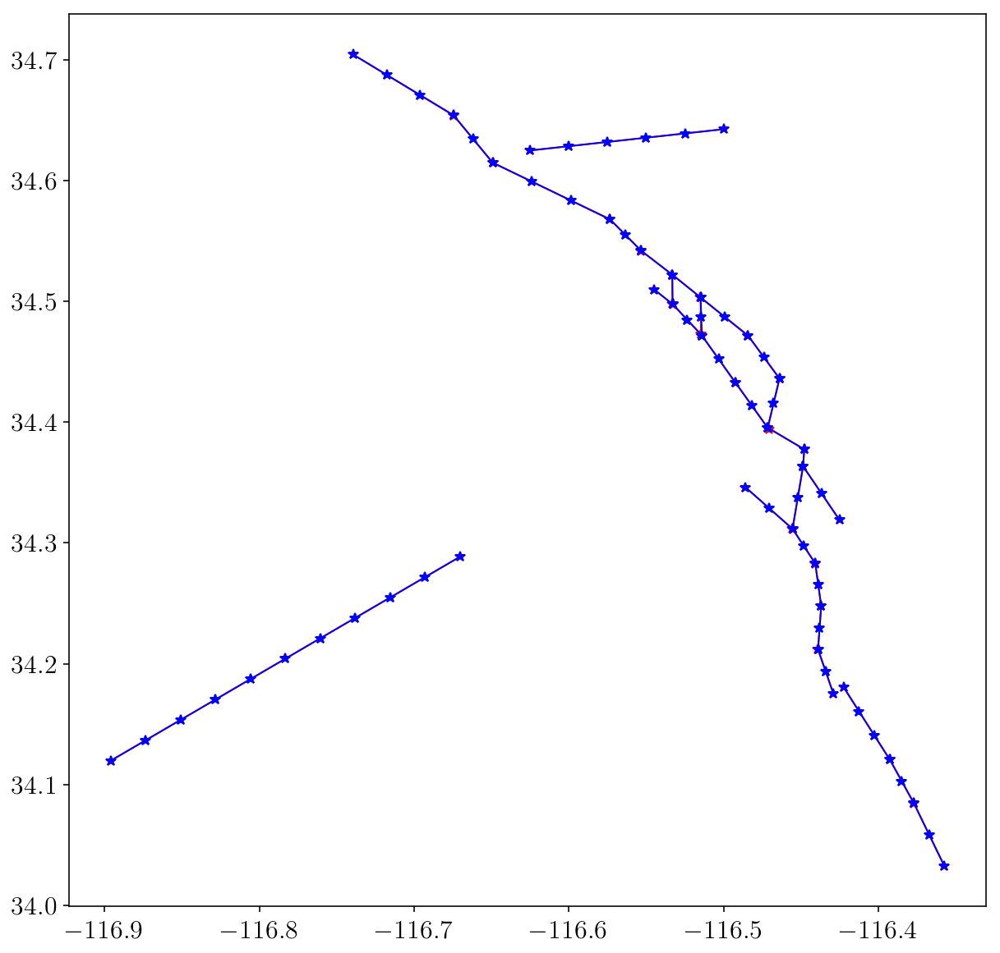

In [14]:
plt.figure(figsize = (10, 10))
for plot_mesh, color in [(m, 'r'), (m_refined, 'b')]:
    for i in range(plot_mesh[1].shape[0]):
        el_pts = plot_mesh[0][plot_mesh[1][i,:]]
        plt.plot(el_pts[:,0], el_pts[:,1], color + '-*', linewidth = 1.0)
plt.show()

In [15]:
surf_center = np.mean(m_refined[0], axis = 0)
fault_L = np.max(np.sqrt(np.sum((m_refined[0] - surf_center) ** 2, axis = 1)))
mesh_size = fault_L / 5
surf_center, fault_L

(array([-116.54857618,   34.37953685]), 0.43390345837679278)

In [16]:
import pygmsh
geom = pygmsh.built_in.Geometry()

w = fault_L * 4
surf_corners = np.array([
    [surf_center[0] - w, surf_center[1] - w, 0],
    [surf_center[0] + w, surf_center[1] - w, 0],
    [surf_center[0] + w, surf_center[1] + w, 0],
    [surf_center[0] - w, surf_center[1] + w, 0],
])
surf = geom.add_polygon(surf_corners, mesh_size)

gmsh_pts = dict()
for edge in m_refined[1]:
    for j in range(2):
        if edge[j] not in gmsh_pts:
            pt = m_refined[0][edge[j]].tolist()
            pt.append(0)
            gmsh_pts[edge[j]] = geom.add_point(pt, mesh_size)
    line = geom.add_line(gmsh_pts[edge[0]], gmsh_pts[edge[1]])
    intersection_code = 'Line{{{}}} In Surface{{{}}};'.format(
        line.id, surf.surface.id
    )
    geom.add_raw_code(intersection_code)

In [17]:
points, cells, pt_data, cell_data, field_data = pygmsh.generate_mesh(
    geom, dim = 2, num_lloyd_steps = 0, num_quad_lloyd_steps = 0
)
surf_m = (points, cells['triangle'])

Info    : Running 'gmsh -2 -bin /tmp/tmphfvsrhd2.geo -o /tmp/tmpknpdsq12.msh' [Gmsh 3.0.5, 1 node, max. 1 thread]
Info    : Started on Wed Dec  6 17:37:49 2017
Info    : Reading '/tmp/tmphfvsrhd2.geo'...
Info    : Done reading '/tmp/tmphfvsrhd2.geo'
Info    : Finalized high order topology of periodic connections
Info    : Meshing 1D...
Info    : Meshing curve 1 (Line)
Info    : Meshing curve 2 (Line)
Info    : Meshing curve 3 (Line)
Info    : Meshing curve 4 (Line)
Info    : Meshing curve 7 (Line)
Info    : Meshing curve 8 (Line)
Info    : Meshing curve 9 (Line)
Info    : Meshing curve 10 (Line)
Info    : Meshing curve 11 (Line)
Info    : Meshing curve 12 (Line)
Info    : Meshing curve 13 (Line)
Info    : Meshing curve 14 (Line)
Info    : Meshing curve 15 (Line)
Info    : Meshing curve 16 (Line)
Info    : Meshing curve 17 (Line)
Info    : Meshing curve 18 (Line)
Info    : Meshing curve 19 (Line)
Info    : Meshing curve 20 (Line)
Info    : Meshing curve 21 (Line)
Info    : Meshing curve

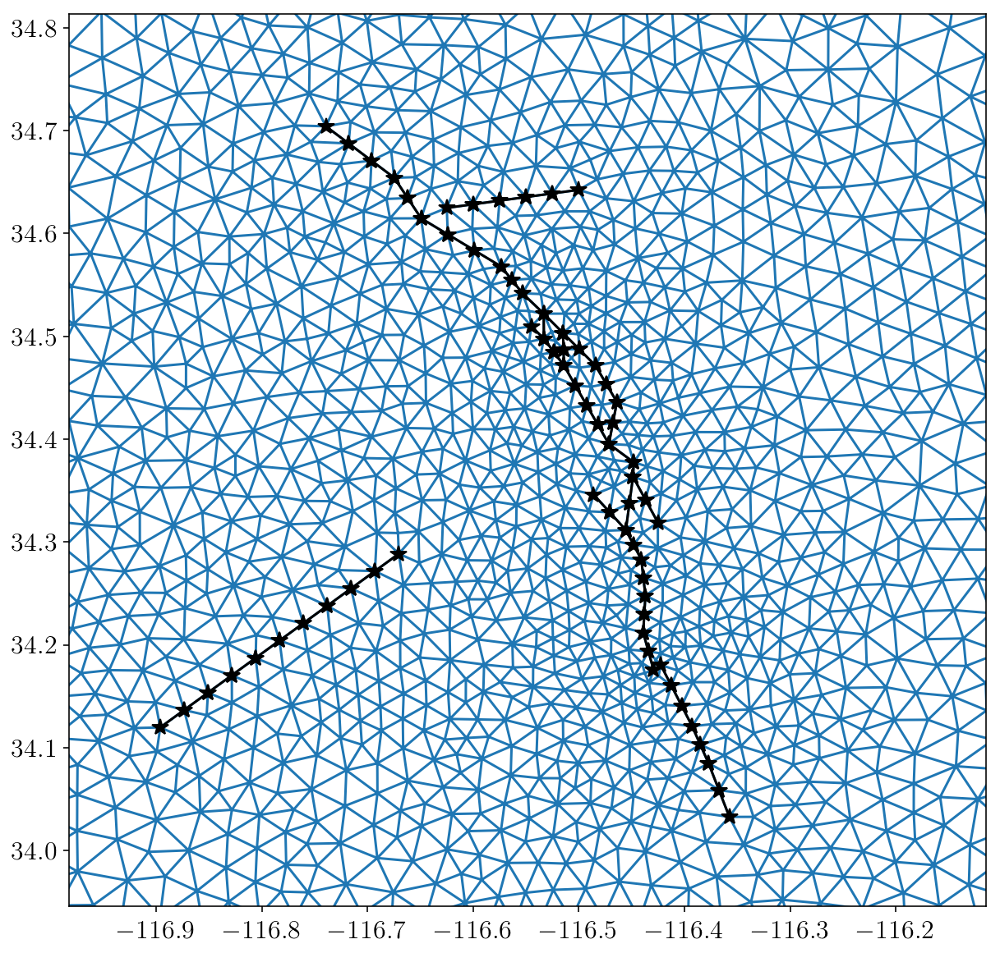

In [18]:
plt.figure(figsize = (10,10))
plt.triplot(points[:,0], points[:,1], cells['triangle'])
for edge in m_refined[1]:
    pts = m_refined[0][edge]
    plt.plot(pts[:,0], pts[:,1], 'k-*', markersize = 10)
vW = 1 * fault_L
plt.xlim([surf_center[0] - vW, surf_center[0] + vW])
plt.ylim([surf_center[1] - vW, surf_center[1] + vW])
plt.show()

In [31]:
fault_pts_proj = collect_dem.project(m_refined[0][:,0], m_refined[0][:,1], 0 * m_refined[0][:,0], proj)
m_proj = (fault_pts_proj, m_refined[1])
surf_pts_proj = collect_dem.project(surf_m[0][:,0], surf_m[0][:,1], surf_m[0][:,2], proj)
surf_proj = (surf_pts_proj, surf_m[1])

11S
11S


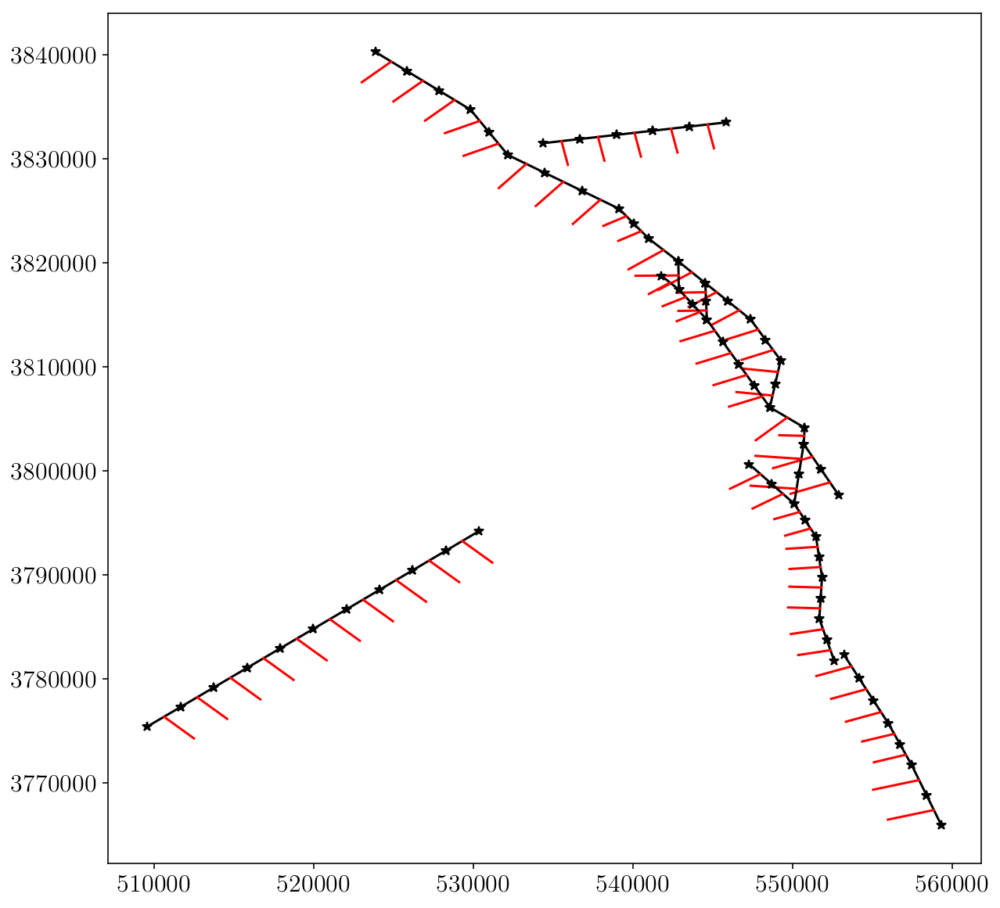

In [56]:
# check the normal vectors!
def normal2d(corners):
    return [-(corners[1,1] - corners[0,1]), corners[1,0] - corners[0,0]]

plt.figure(figsize = (10,10))
for edge in m_proj[1]:
    pts = m_proj[0][edge,:2]
    plt.plot(pts[:,0], pts[:,1], 'k-*')
    normal = normal2d(pts)
    center = np.mean(pts, axis = 0)
    normal_line = np.array([center, center + normal])
    plt.plot(normal_line[:,0], normal_line[:,1], 'r-')
plt.show()

In [122]:
geom = pygmsh.built_in.Geometry()

fC, R = inverse_tools.get_fault_centered_view(CombinedMesh.from_named_pieces([('fault', m_proj)]))
mesh_size = R / 10.0

gmsh_pts = dict()
for edge in m_proj[1]:
    for j in range(2):
        if edge[j] not in gmsh_pts:
            pt = m_proj[0][edge[j]].tolist()
            pt.append(0)
            gmsh_pts[edge[j]] = geom.add_point(pt, mesh_size)
    line = geom.add_line(gmsh_pts[edge[0]], gmsh_pts[edge[1]])
    geom.add_raw_code("Extrude {0, 0, -10000} { Line{" + str(line.id) + "};  }")
points, cells, pt_data, cell_data, field_data = pygmsh.generate_mesh(
    geom, dim = 2, num_lloyd_steps = 0, num_quad_lloyd_steps = 0
)

Info    : Running 'gmsh -2 -bin /tmp/tmp08x03y8x.geo -o /tmp/tmpav0bsxx2.msh' [Gmsh 3.0.5, 1 node, max. 1 thread]
Info    : Started on Wed Dec  6 21:18:09 2017
Info    : Reading '/tmp/tmp08x03y8x.geo'...
Info    : Done reading '/tmp/tmp08x03y8x.geo'
Info    : Finalized high order topology of periodic connections
Info    : Meshing 1D...
Info    : Meshing curve 1 (Line)
Info    : Meshing curve 2 (Line)
Info    : Meshing curve 3 (Line)
Info    : Meshing curve 4 (Line)
Info    : Meshing curve 6 (Line)
Info    : Meshing curve 7 (Line)
Info    : Meshing curve 9 (Line)
Info    : Meshing curve 11 (Line)
Info    : Meshing curve 12 (Line)
Info    : Meshing curve 14 (Line)
Info    : Meshing curve 16 (Line)
Info    : Meshing curve 17 (Line)
Info    : Meshing curve 18 (Line)
Info    : Meshing curve 19 (Line)
Info    : Meshing curve 21 (Line)
Info    : Meshing curve 22 (Line)
Info    : Meshing curve 26 (Line)
Info    : Meshing curve 27 (Line)
Info    : Meshing curve 28 (Line)
Info    : Meshing curve

In [123]:
full_fault_mesh = (points, cells['triangle'])

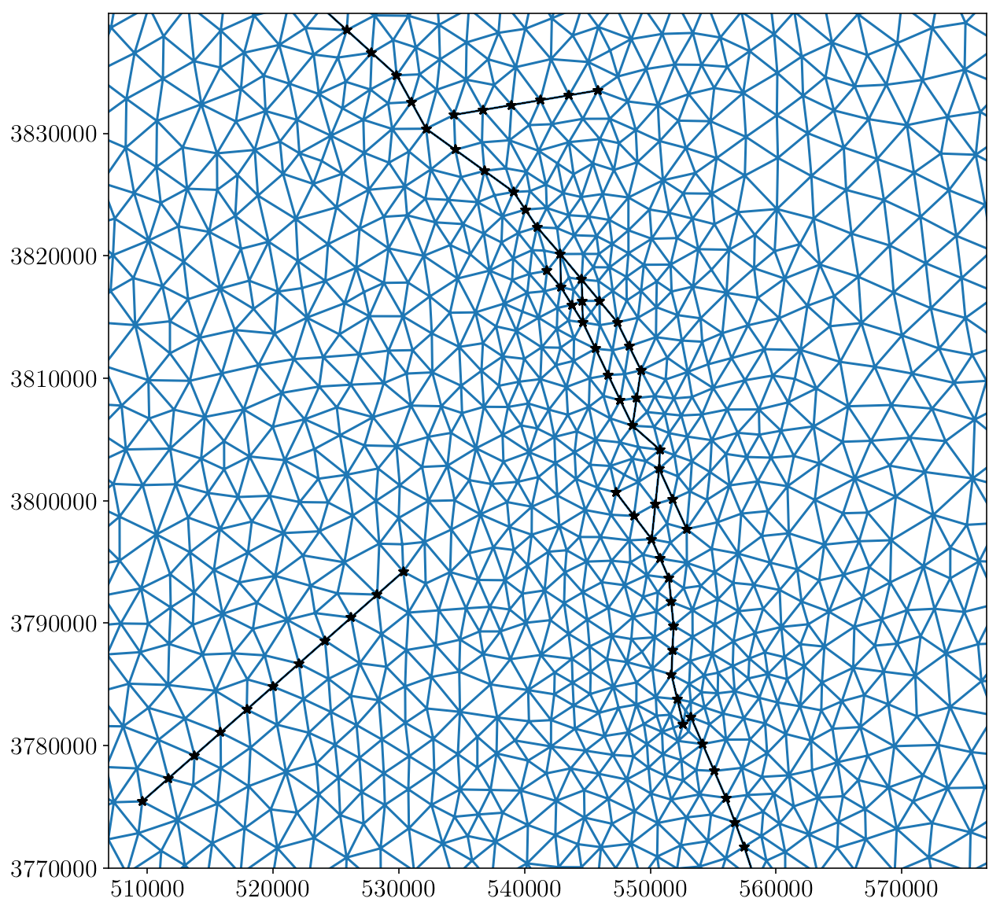

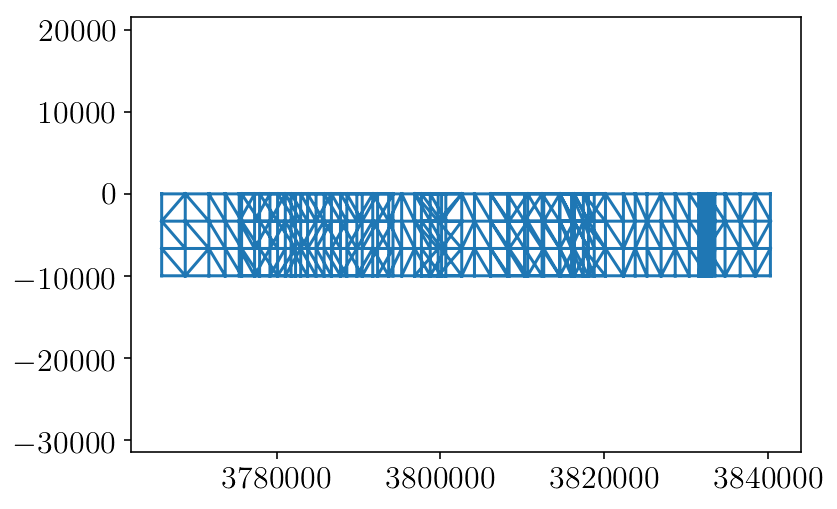

In [124]:
plt.show()
plt.figure(figsize = (10,10))
plt.triplot(surf_proj[0][:,0], surf_proj[0][:,1], surf_proj[1])
plt.triplot(full_fault_mesh[0][:,0], full_fault_mesh[0][:,1], full_fault_mesh[1], 'k-*', linewidth = 0.5)

view_R = 0.8
plt.xlim([fC[0] - view_R * R, fC[0] + view_R * R])
plt.ylim([fC[1] - view_R * R, fC[1] + view_R * R])

plt.show()
plt.triplot(full_fault_mesh[0][:,1], full_fault_mesh[0][:,2], full_fault_mesh[1])#, linewidths = 0.5)
plt.axis('equal')
plt.show()

In [125]:
full_m = CombinedMesh.from_named_pieces([('surf', surf_proj), ('fault', full_fault_mesh)])

In [126]:
np.save('mesh.npy', (full_m.pts, full_m.tris))

In [127]:
m_with_topo = mesh_fncs.set_surf_elevations(full_m, n_dem_interp_pts, zoom, proj)
m_refined = mesh_fncs.set_surf_elevations(m_with_topo.refine().refine(), n_dem_interp_pts * 2, zoom + 2, proj)
m_refined.n_tris()

11S
downloading dem data for bounds = (32.296800248270721, -118.63131277534977, 36.462273448687959, -114.46583957493255) and zoom = 5
5 5 12
11S
11S
downloading dem data for bounds = (32.296799461802486, -118.63131277534977, 36.462282099838596, -114.46583957493255) and zoom = 7
7 21 50
7 22 50
7 23 50
7 21 51
7 22 51
7 23 51
11S


158880

In [130]:
np.save('mesh_refined.npy', m_refined)

In [8]:
m_refined = np.load('mesh_refined.npy').tolist()

11S
11S
11S
11S


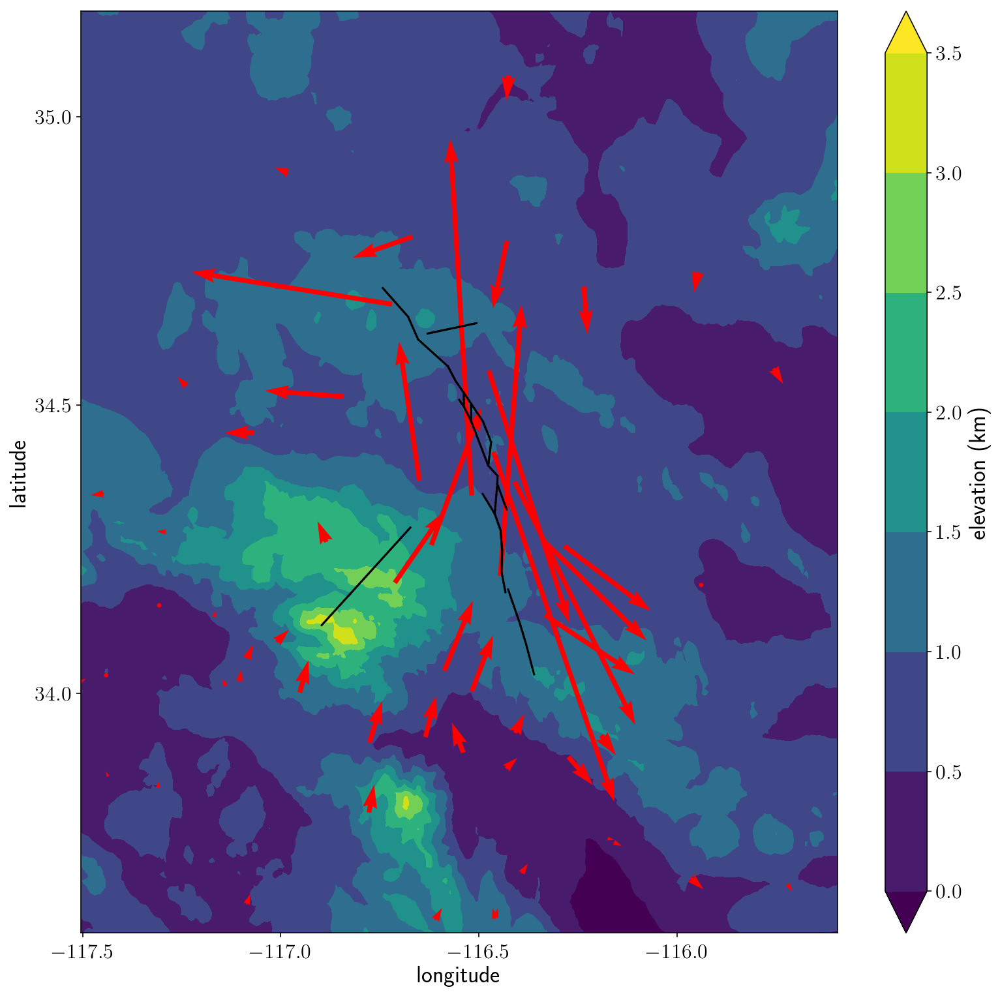

In [8]:
inverse_tools.plot_situation(
    m_refined, data, 
    view_R = 2.0, proj = proj, 
    min_elevation = 0, max_elevation = 3.5, 
    filename = 'landers_map.pdf'
)

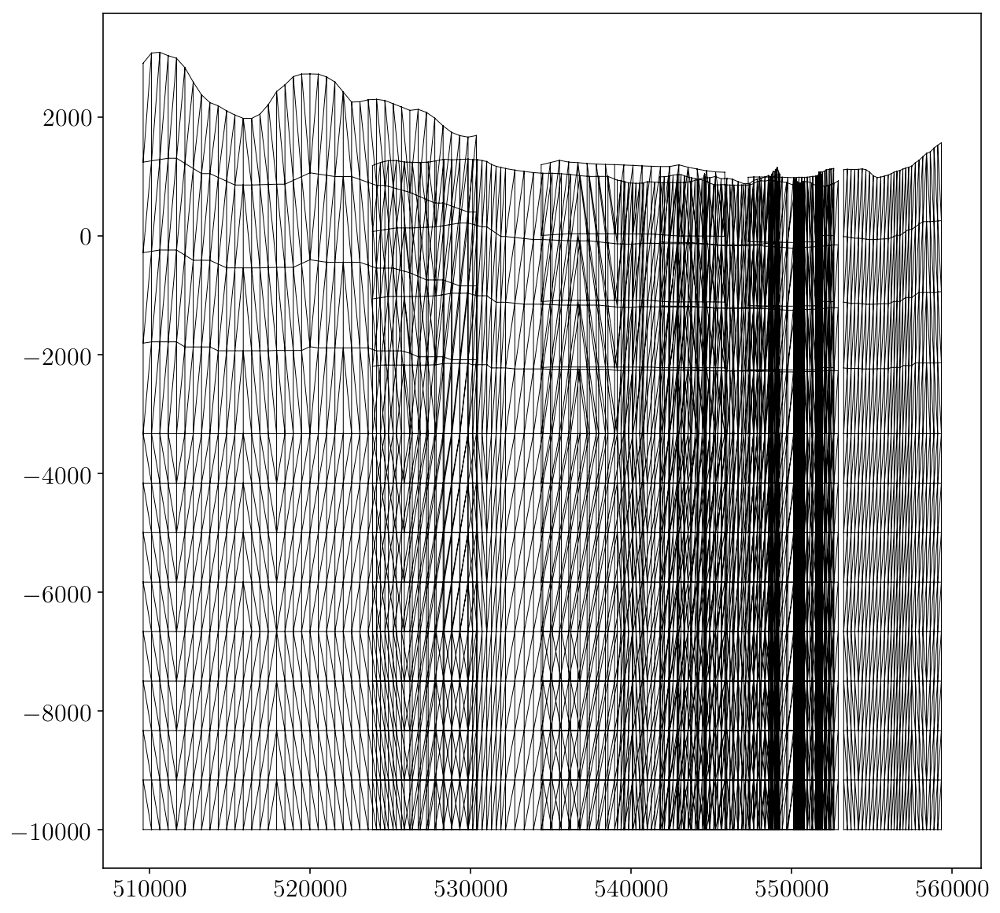

In [9]:
plt.figure(figsize = (10, 10))
plt.triplot(m_refined.pts[:,0], m_refined.pts[:,2], m_refined.get_tris('fault'), 'k-', linewidth = 0.5)
plt.show()

In [8]:
m_xyz = mesh_fncs.to_sphere_xyz(m_refined, proj)
np.save('m_xyz.npy', [m_xyz.pts, m_xyz.tris])

11S


In [9]:
fC, R = inverse_tools.get_fault_centered_view(m_xyz)
view_R = 1.0

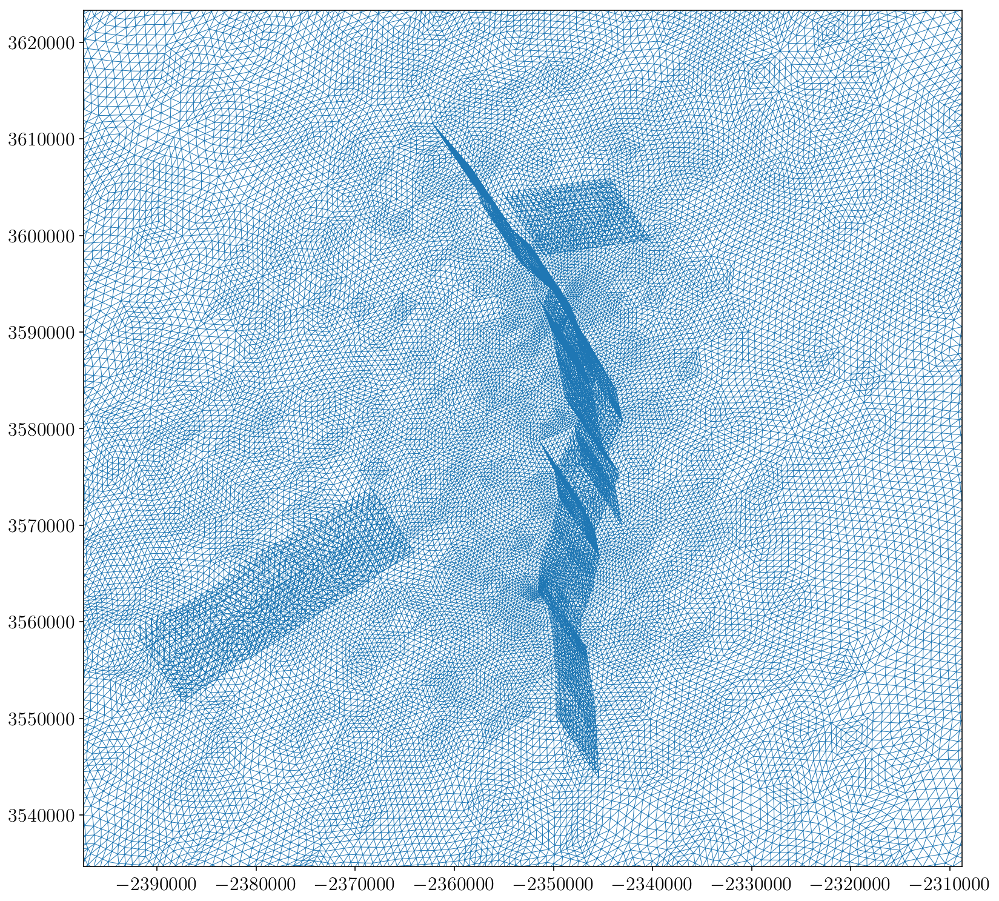

In [10]:
plt.figure(figsize = (13, 13))
plt.triplot(m_xyz.pts[:,0], m_xyz.pts[:,2], m_xyz.tris, linewidth = 0.5)
plt.xlim([fC[0] - view_R * R, fC[0] + view_R * R])
plt.ylim([fC[2] - view_R * R, fC[2] + view_R * R])
plt.show()

In [9]:
# def data_to_xyz(data, proj):
#     lonlatz = collect_dem.project(data['X'], data['Y'], 0 * data['Y'], proj, inverse = True)
#     xyz_sphere = collect_dem.project(lonlatz[:,0], lonlatz[:,1], lonlatz[:,2], 'ellps')
#     data = data.copy()
#     data['X'] = xyz_sphere[]
# #     data_inverse 

xyz = False
if xyz:
    inverse_proj = 'ellps'
    m_inverse = m_xyz
    def get_vertical(pts):
        # radial direction
        center = np.mean(pts, axis = 0)
        vertical_unit_vector = center / np.linalg.norm(center)
        return vertical_unit_vector
else:
    inverse_proj = proj
    m_inverse = m_refined
    get_vertical = None

In [14]:
def build_dir_map(m, from_proj, to_proj):
    #TODO: It'd be better to use vertices instead of the triangle center, 
    # but the error is essentially 0 from doing it this way
    tri_pts = m.pts[m.tris]
    tri_centers = np.mean(tri_pts, axis = 1)
    nt = tri_centers.shape[0]
    all_pts = [tri_centers]
    for d in range(3):
        moved = tri_centers.copy()
        moved[:,d] += 1.0
        all_pts.append(moved)
    all_pts = np.concatenate(all_pts)
    lonlatz = collect_dem.project(all_pts[:,0], all_pts[:,1], all_pts[:,2], from_proj, inverse = True)
    utm_xyz = collect_dem.project(lonlatz[:,0], lonlatz[:,1], lonlatz[:,2], to_proj)
    utm_centers = utm_xyz[:nt]
    utm_dirs = [utm_xyz[((d + 1) * nt):((d + 2) * nt)] - utm_centers for d in range(3)]
    out =  np.swapaxes(np.swapaxes(np.array(utm_dirs), 0, 1), 1, 2)
    # R * R.T ~ I (not exactly because there is a small amount of stretch in the projection transform)
    print(out[0,:,:].dot(out[0,:,:].T))
    return out

# dir_map_{ijk} represents for each triangle i the j component of a utm vector
# corresponding to a unit vector in the k vector in ellps coords 
dir_map = build_dir_map(m_refined, proj, inverse_proj)

11S
11S
[[  9.99999999e-01  -1.22236088e-09   0.00000000e+00]
 [ -1.22236088e-09   1.00000000e+00   0.00000000e+00]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]


In [63]:
#dir_map2 = build_dir_map(m_refined, proj, inverse_proj)
#dir_map1 = build_dir_map(m_inverse, inverse_proj, proj)

11S
[[  1.00092288e+00  -3.00337667e-04   2.33087864e-04]
 [ -3.00337667e-04   1.00050295e+00   4.47357531e-04]
 [  2.33087864e-04   4.47357531e-04   1.00073445e+00]]
11S
[[  9.98921961e-01  -3.55974961e-08   6.28063827e-08]
 [ -3.55974961e-08   9.98920229e-01  -6.01963400e-09]
 [  6.28063827e-08  -6.01963400e-09   9.99999954e-01]]


In [16]:
soln_to_obs, rhs, pts_inside = inverse_tools.setup_data_matrices(m_refined, data, [0, 1])#, dir_map)
slip_matrix = inverse_tools.build_slip_matrix(m_inverse, get_vertical = get_vertical)

number of observation points outside the surface mesh: 8


In [43]:
# W_diag = 1.0 / np.array([data_inverse['Eerr'],data_inverse['Nerr']]).T.copy()[pts_inside[:,0]].flatten()
# W = scipy.sparse.diags(W_diag, 0)
# W_rhs = W.dot(rhs)
# W_soln_to_obs = W.dot(soln_to_obs)

In [44]:
# def slip_constraints(fault):
#     from tectosaur.constraint_builders import continuity_constraints
#     from tectosaur.constraints import build_constraint_matrix
#     cs = continuity_constraints(fault[1], np.zeros((0,3)), tensor_dim = 2)
#     cm, c_rhs = build_constraint_matrix(cs, fault[1].shape[0] * 6)
#     np.testing.assert_almost_equal(c_rhs, 0.0)
#     return cm
# slip_continuity = slip_constraints((m_inverse.pts, m_inverse.get_tris('fault')))

In [22]:
os.environ['CUDA_DEVICE'] = '1'
integral_eqs = inverse_tools.assemble_integral_eqs(m_inverse)

[3920029:INFO:tectosaur_topo]
    forward_assemble configuration: 
{'float_type': <class 'numpy.float32'>,
 'fmm_mac': 3.0,
 'fmm_order': 150,
 'log_level': 20,
 'preconditioner': 'ilu',
 'pts_per_cell': 450,
 'quad_far_order': 2,
 'quad_mass_order': 3,
 'quad_near_order': 5,
 'quad_near_threshold': 2.0,
 'quad_vertadj_order': 6,
 'use_fmm': True}
[3956453:INFO:tectosaur.util.cuda]
    Initialized CUDA on gpu: 1
[4183860:INFO:tectosaur_topo]
    adjoint_assemble configuration: 
{'float_type': <class 'numpy.float32'>,
 'fmm_mac': 3.0,
 'fmm_order': 150,
 'log_level': 20,
 'preconditioner': 'ilu',
 'pts_per_cell': 450,
 'quad_far_order': 2,
 'quad_mass_order': 3,
 'quad_near_order': 5,
 'quad_near_threshold': 2.0,
 'quad_vertadj_order': 6,
 'use_fmm': True}


In [10]:
tol = 5e-4
continuous = False
should_weight = False

In [68]:
full_slip_matrix = slip_matrix
if continuous:
    full_slip_matrix = slip_matrix.dot(slip_continuity)
if should_weight:
    s2o = W_soln_to_obs
    final_rhs = W_rhs
else:
    s2o = soln_to_obs
    final_rhs = rhs
raw_inverse_soln = inverse_tools.inversion(integral_eqs, s2o, final_rhs, full_slip_matrix, tol)

inverse_soln_xyz = raw_inverse_soln
if continuous:
    inverse_soln_xyz = [slip_continuity.dot(raw_inverse_soln[0])]

[172925891:INFO:tectosaur_topo]
    forward_solve configuration: 
{'log_level': 20, 'solver_tol': 1e-08}
[172929543:INFO:tectosaur_topo]
    forward_solve configuration: 
{'log_level': 20, 'solver_tol': 1e-08}
 
LSMR            Least-squares solution of  Ax = b

The matrix A has      166 rows  and    38016 cols
damp = 0.00000000000000e+00

atol = 5.00e-04                 conlim = 1.00e+08

btol = 5.00e-04             maxiter =      166

[172933130:INFO:tectosaur_topo]
    adjoint_solve configuration: 
{'log_level': 20, 'solver_tol': 1e-08}
 
   itn      x(1)       norm r    norm Ar  compatible   LS      norm A   cond A
     0  0.00000e+00  3.872e+02  1.389e+01   1.0e+00  9.3e-05
[172942247:INFO:tectosaur_topo]
    forward_solve configuration: 
{'log_level': 20, 'solver_tol': 1e-08}
[172958278:INFO:tectosaur_topo]
    adjoint_solve configuration: 
{'log_level': 20, 'solver_tol': 1e-08}
     1 -3.23413e+00  3.334e+02  8.617e+00   8.6e-01  4.0e-01  6.5e-02  1.5e+01
[172966896:INFO:tectosa

[173719526:INFO:tectosaur_topo]
    adjoint_solve configuration: 
{'log_level': 20, 'solver_tol': 1e-08}
[173728032:INFO:tectosaur_topo]
    forward_solve configuration: 
{'log_level': 20, 'solver_tol': 1e-08}
[173744025:INFO:tectosaur_topo]
    adjoint_solve configuration: 
{'log_level': 20, 'solver_tol': 1e-08}
[173753093:INFO:tectosaur_topo]
    forward_solve configuration: 
{'log_level': 20, 'solver_tol': 1e-08}
[173769058:INFO:tectosaur_topo]
    adjoint_solve configuration: 
{'log_level': 20, 'solver_tol': 1e-08}
[173777621:INFO:tectosaur_topo]
    forward_solve configuration: 
{'log_level': 20, 'solver_tol': 1e-08}
[173793523:INFO:tectosaur_topo]
    adjoint_solve configuration: 
{'log_level': 20, 'solver_tol': 1e-08}
[173802432:INFO:tectosaur_topo]
    forward_solve configuration: 
{'log_level': 20, 'solver_tol': 1e-08}
[173817066:INFO:tectosaur_topo]
    adjoint_solve configuration: 
{'log_level': 20, 'solver_tol': 1e-08}
[173825853:INFO:tectosaur_topo]
    forward_solve confi

[174636836:INFO:tectosaur_topo]
    adjoint_solve configuration: 
{'log_level': 20, 'solver_tol': 1e-08}
    70 -1.99104e+01  3.657e+01  6.021e-02   9.4e-02  1.7e-03  9.7e-01  5.3e+01
[174645551:INFO:tectosaur_topo]
    forward_solve configuration: 
{'log_level': 20, 'solver_tol': 1e-08}
[174661460:INFO:tectosaur_topo]
    adjoint_solve configuration: 
{'log_level': 20, 'solver_tol': 1e-08}
[174670086:INFO:tectosaur_topo]
    forward_solve configuration: 
{'log_level': 20, 'solver_tol': 1e-08}
[174684491:INFO:tectosaur_topo]
    adjoint_solve configuration: 
{'log_level': 20, 'solver_tol': 1e-08}
[174693022:INFO:tectosaur_topo]
    forward_solve configuration: 
{'log_level': 20, 'solver_tol': 1e-08}
[174707396:INFO:tectosaur_topo]
    adjoint_solve configuration: 
{'log_level': 20, 'solver_tol': 1e-08}
[174715872:INFO:tectosaur_topo]
    forward_solve configuration: 
{'log_level': 20, 'solver_tol': 1e-08}
[174730335:INFO:tectosaur_topo]
    adjoint_solve configuration: 
{'log_level': 2

In [49]:
np.save(str(tol) + '_' + str(continuous) + str(should_weight) + str(xyz) + '_inversion.npy', inverse_soln_xyz)

In [11]:
inverse_soln_xyz = np.load(str(tol) + '_' + str(continuous) + str(should_weight) + str(xyz) + '_inversion.npy')

In [17]:
np.testing.assert_almost_equal(slip_matrix.T.dot(slip_matrix.dot(inverse_soln_xyz[0])) - inverse_soln_xyz[0], 0)
inverse_soln_xyz[0].reshape((-1, 3, 2)).shape, m_inverse.get_tris('fault').shape, slip_matrix.shape

((6336, 3, 2), (6336, 3), (57024, 38016))

In [18]:
def soln_to_utm(soln_xyz):
    S_xyz = slip_matrix.dot(soln_xyz).reshape((-1, 3, 3))
    S_utm = np.zeros_like(S_xyz)
    for i,f_idx in enumerate(m_inverse.get_tri_idxs('fault')):
        for b in range(3):
            S_utm[i, b, :] += dir_map[f_idx, :, :].dot(S_xyz[i, b, :])
        # print(S_utm[i], S_xyz[i], dir_map[f_idx, :, :])
        # print(np.linalg.norm(S_utm[i], axis = 1))
        # print(np.linalg.norm(S_xyz[i], axis = 1))
    return slip_matrix.T.dot(S_utm.reshape(-1))
inverse_soln = [soln_to_utm(inverse_soln_xyz[0])]

In [19]:
if not xyz:
    np.testing.assert_almost_equal(inverse_soln[0], inverse_soln_xyz[0], 6)

In [ ]:
# check continuity
# fault_tris = m_refined.get_tris('fault')
# fault_pt_idxs = m_refined.get_pt_idxs('fault')
# for i in range(fault_pt_idxs.shape[0]):
#     idxs = np.where(fault_tris == fault_pt_idxs[i])
#     for d in range(2):
#         dofs = idxs[0] * 6 + idxs[1] * 2 + d
#         np.testing.assert_almost_equal(inverse_soln[0][dofs], inverse_soln[0][dofs[0]])

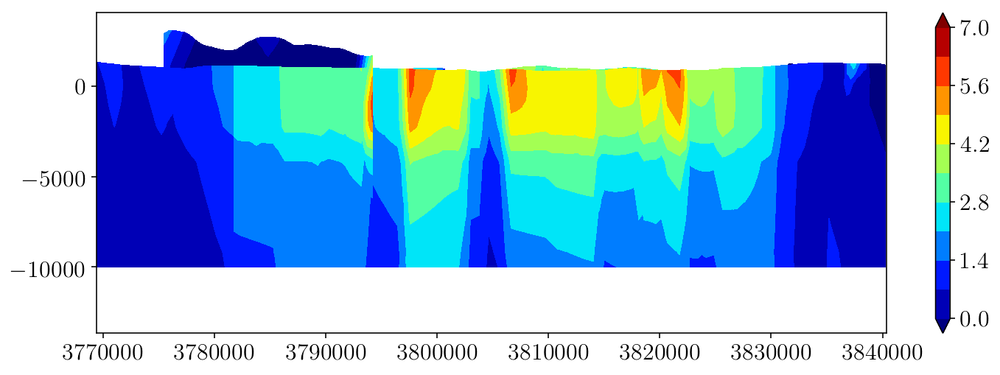

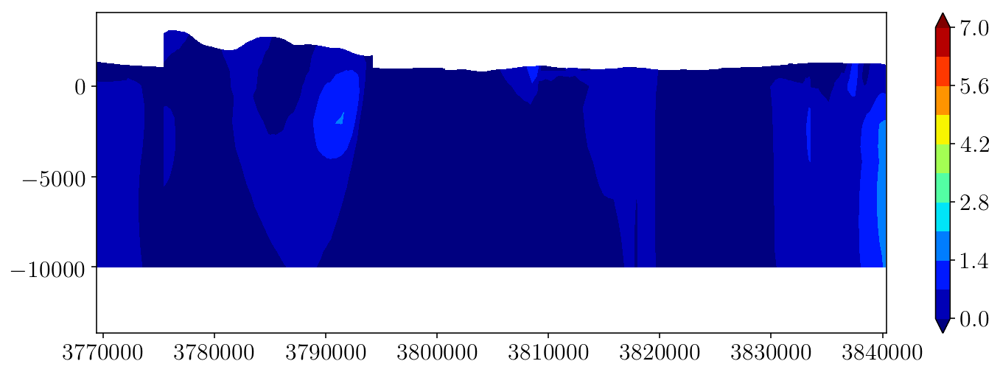

In [20]:
def initial_plot(m, S):
    for comp in range(2):
        vert_vals = inverse_tools.get_vert_vals_linear(
            (m.pts, m.get_tris('fault')), 
            S.reshape((-1,3,2))[:,:,comp]
        )
        vert_vals /= 100.
        if comp == 0:
            vert_vals *= -1

        plt.figure(figsize = (12,4))
        sdim = [1,2]
        #plt.triplot(m.pts[:,sdim[0]], m.pts[:,sdim[1]], m.get_tris('fault'), 'k-', linewidth = 0.1)
        # plt.tripcolor(
        #     m.pts[:,0], m.pts[:,1], 
        #     m.get_tris('fault'), soln[:,comp].reshape((-1,3))[:,0], 
        #     'k-', vmin = -200, vmax = 0
        # )
        levels = np.linspace(-7, 7, 11)
        cntf = plt.tricontourf(
            m.pts[:,sdim[0]], m.pts[:,sdim[1]], 
            m.get_tris('fault'), vert_vals, 
            levels = levels, extend = 'both', cmap = 'jet'#'Reds'
        )
    #     plt.tricontour(
    #         m.pts[:,sdim[0]], m.pts[:,sdim[1]], 
    #         m.get_tris('fault'), vert_vals, 
    #         levels = levels,
    #         colors = '#333333', linestyles = 'solid', linewidths = 1.0
    #     )

        fC, R = inverse_tools.get_fault_centered_view(m)
        view_R = 0.8

        plt.xlim([fC[sdim[0]] - view_R * R, fC[sdim[0]] + view_R * R])
        plt.ylim([fC[sdim[1]] - view_R * R / 4, fC[sdim[1]] + view_R * R / 4])
        plt.colorbar(cntf)
        #plt.savefig(['strike','dip'][comp] + '-slip2.png')
        plt.show()
#initial_plot(m_inverse, inverse_soln_xyz[0])
initial_plot(m_refined, inverse_soln[0])

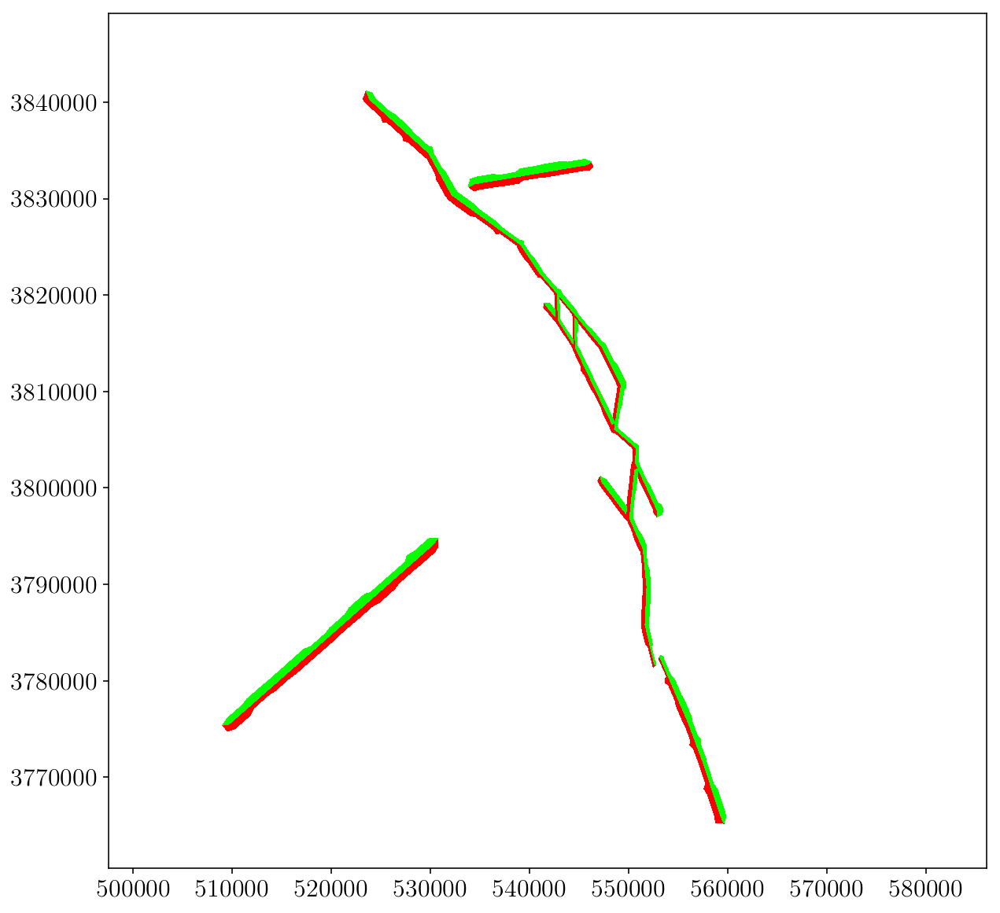

In [24]:
side = inverse_tools.get_side_of_fault(m_refined)
inverse_tools.plot_side_of_fault(m_refined, side)

In [23]:
u_surf, data_modeled = inverse_tools.calc_modeled_data(integral_eqs, soln_to_obs, slip_matrix, inverse_soln_xyz)

[4880397:INFO:tectosaur_topo]
    forward_solve configuration: 
{'log_level': 20, 'solver_tol': 1e-08}


In [38]:
np.mean(np.abs(rhs - data_modeled))

4.6994616433722465

3.34065934066 2.03170403326 2.48742689174


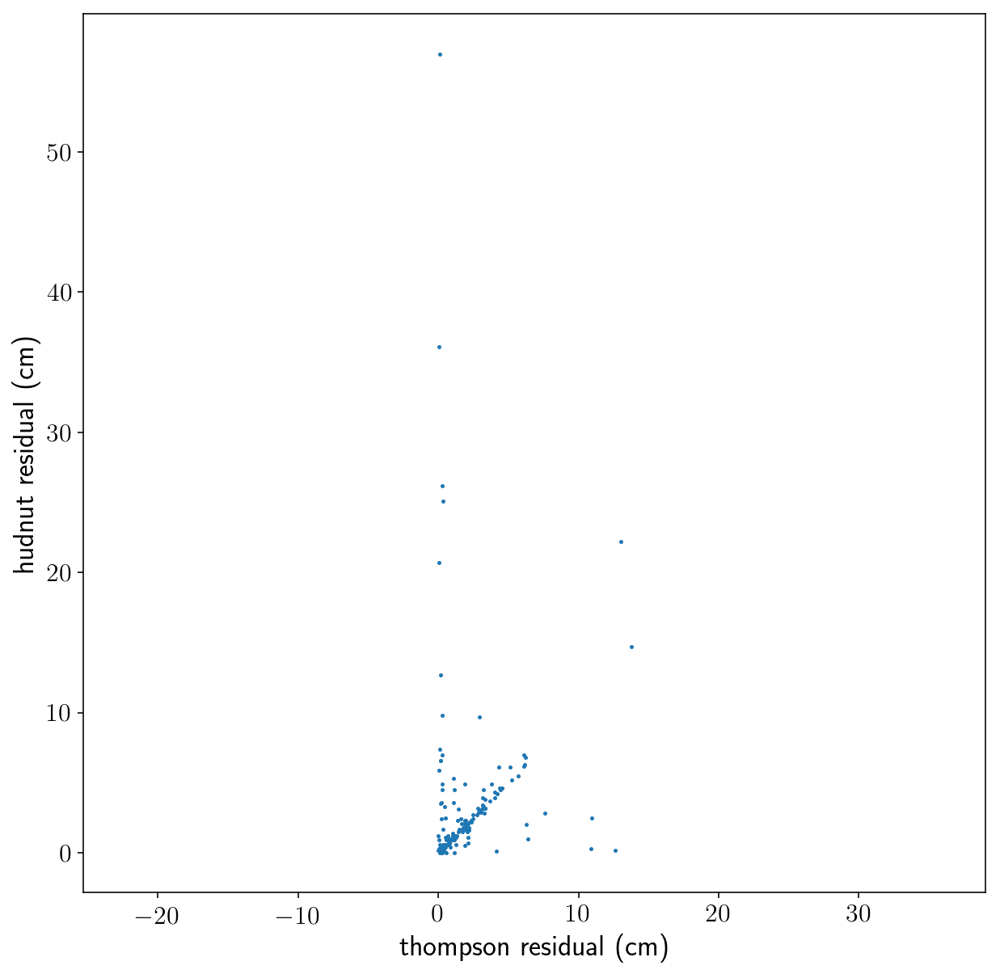

In [59]:
# TODOMAYBE: color-code by above or below the 1-1 line.
residual = rhs - data_modeled
hudnut_res = np.array([data['Eres'], data['Nres']]).T
print(np.mean(np.abs(hudnut_res)), np.mean(np.abs(residual)), np.mean(np.abs(W.dot(residual))))
plt.figure(figsize = (10,10))
plt.plot(np.abs(residual), np.abs(hudnut_res[pts_inside[:,0]].flatten()), '.', markersize = 3)
plt.xlabel('thompson residual (cm)')
plt.ylabel('hudnut residual (cm)')
plt.axis('equal')
#plt.savefig('residual_corr.pdf')
plt.show()

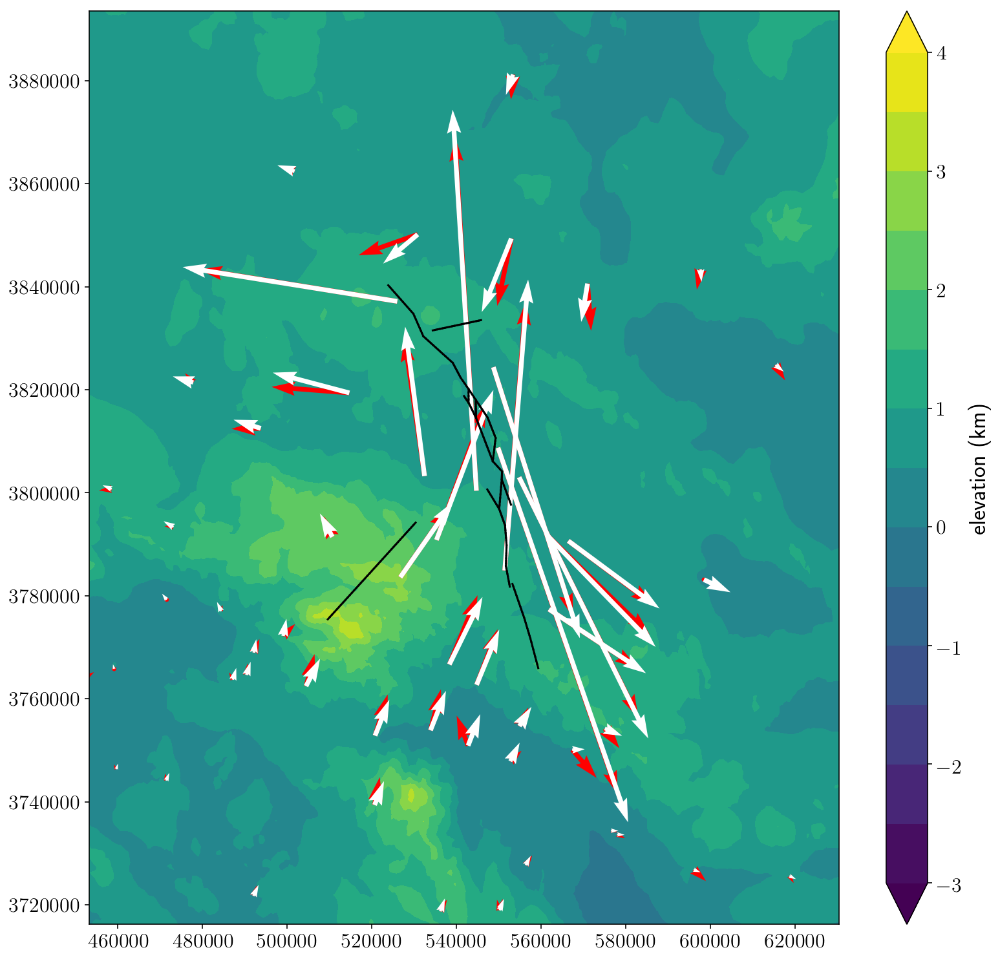

In [36]:
modeled = np.zeros((data['SN'].shape[0], 2))
modeled[pts_inside[:,0]] = data_modeled.reshape((-1,2))
inverse_tools.plot_situation(m_refined, data, modeled = modeled)

11S
11S
11S
11S


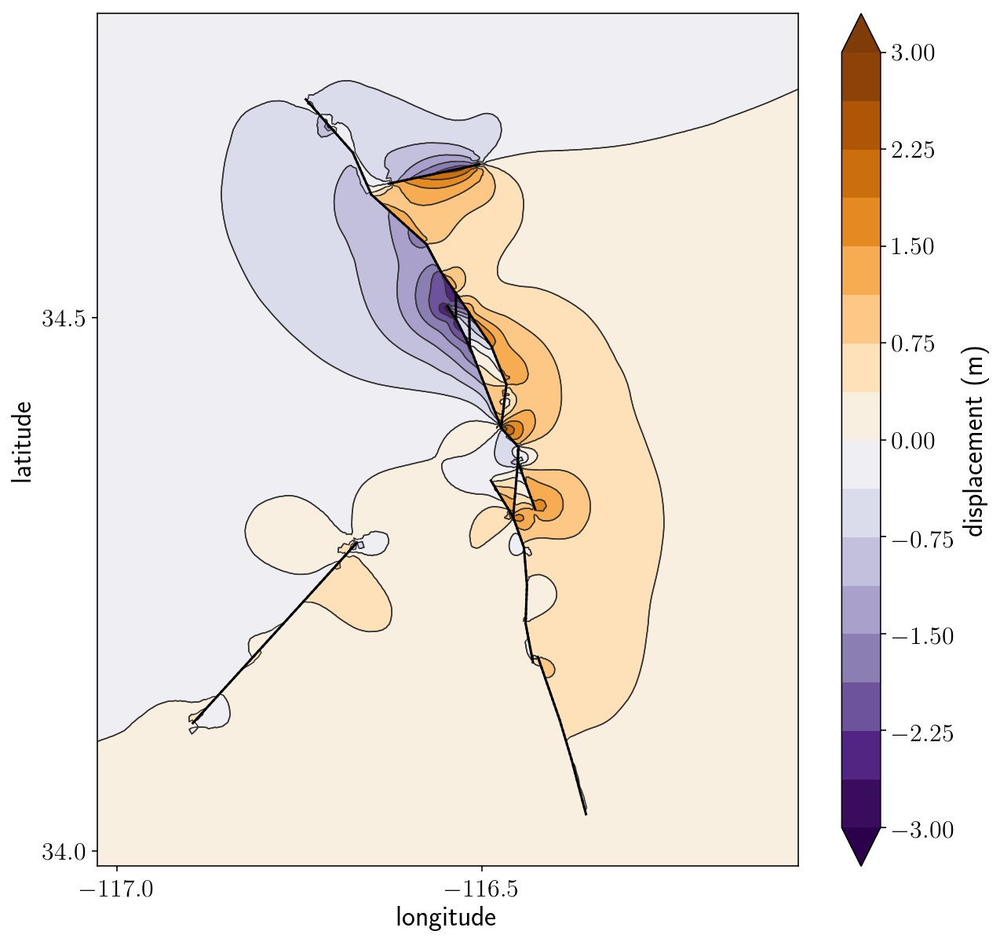

11S
11S
11S
11S


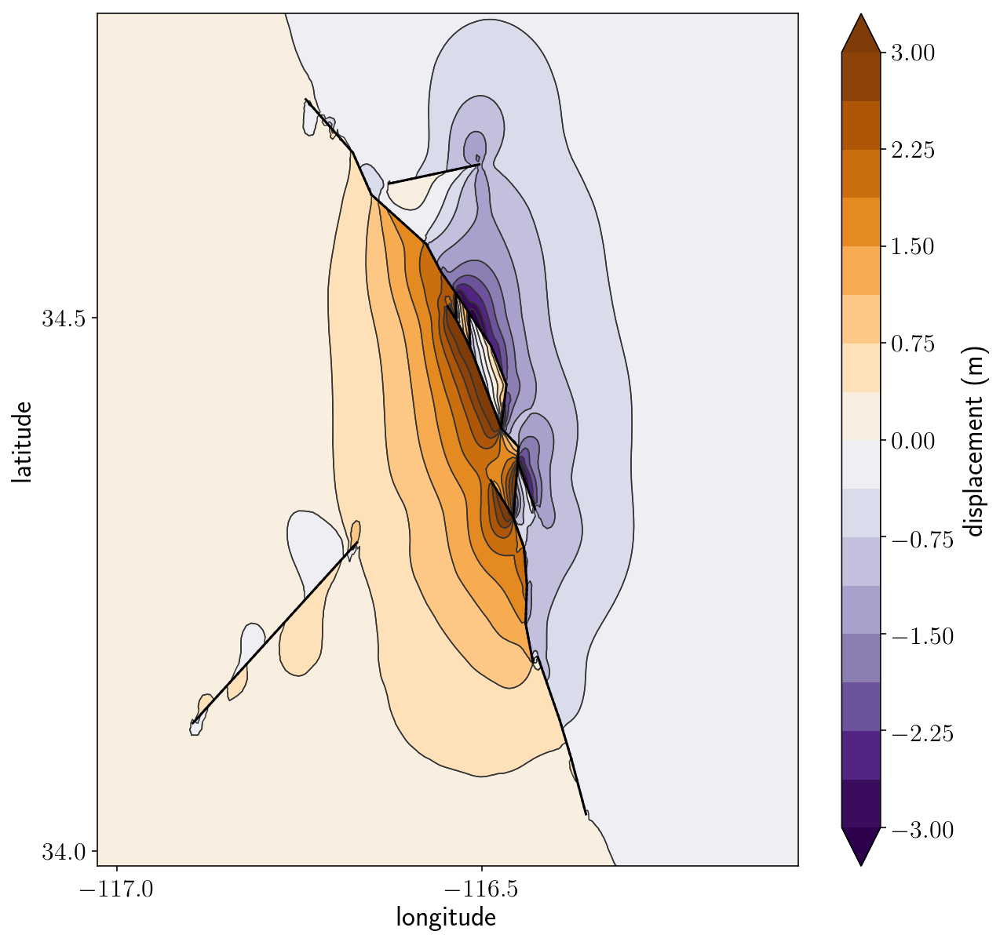

11S
11S
11S
11S


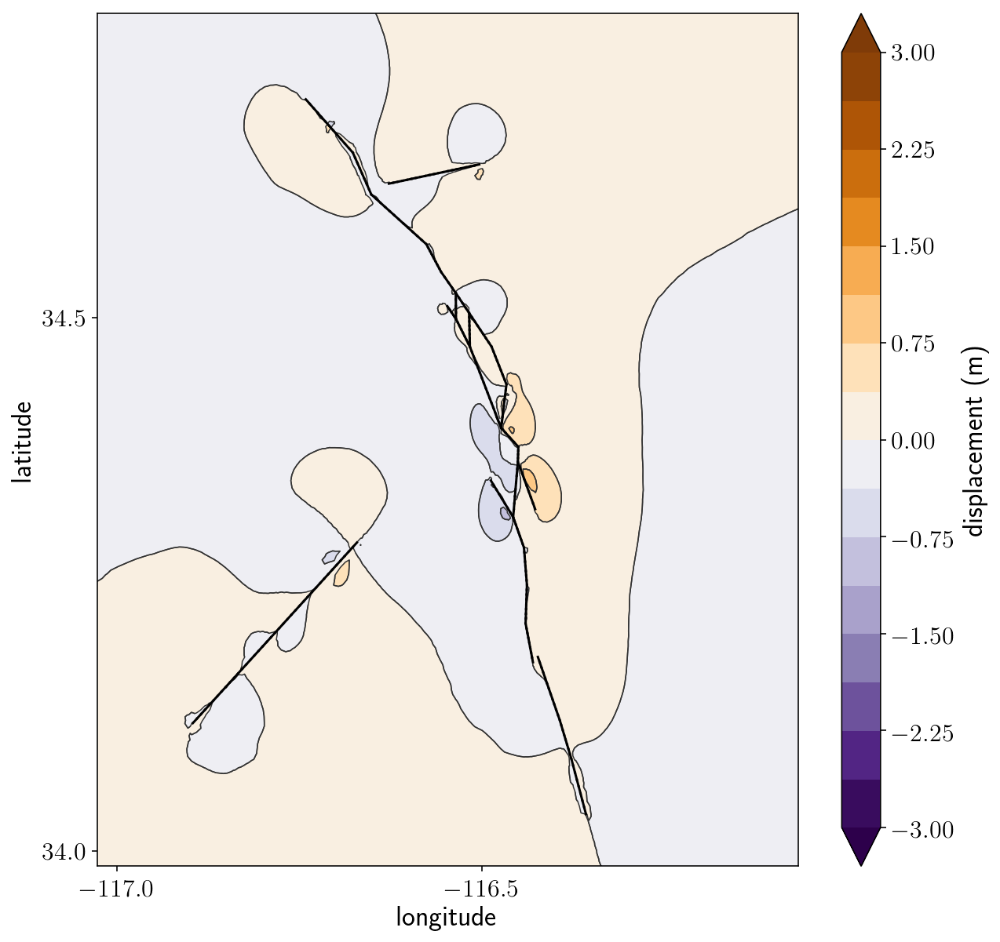

In [26]:
for d in range(3):
    name = 'u' + ['x','y','z'][d]
    field = m_refined.get_dofs(u_surf, 'surf').reshape((-1,3,3))[:,:,d] / 100.0
    inverse_tools.plot_surf_disp(m_refined, side, field, '', vmin = -3.0, vmax = 3.0, view_R = 1.0, proj = proj, filename = None)#'forward_uy.pdf')

In [29]:
tri_depth, avg_tri_moment = inverse_tools.moment_analysis(m_refined, inverse_soln, proj)

potency: 3339809193.64
M0: 1.00194275809e+20
M: 7.3005619404
11S
downloading dem data for bounds = (33.968055387515754, -116.94778480292747, 34.76965666227273, -116.30468965705008) and zoom = 5
5 5 12


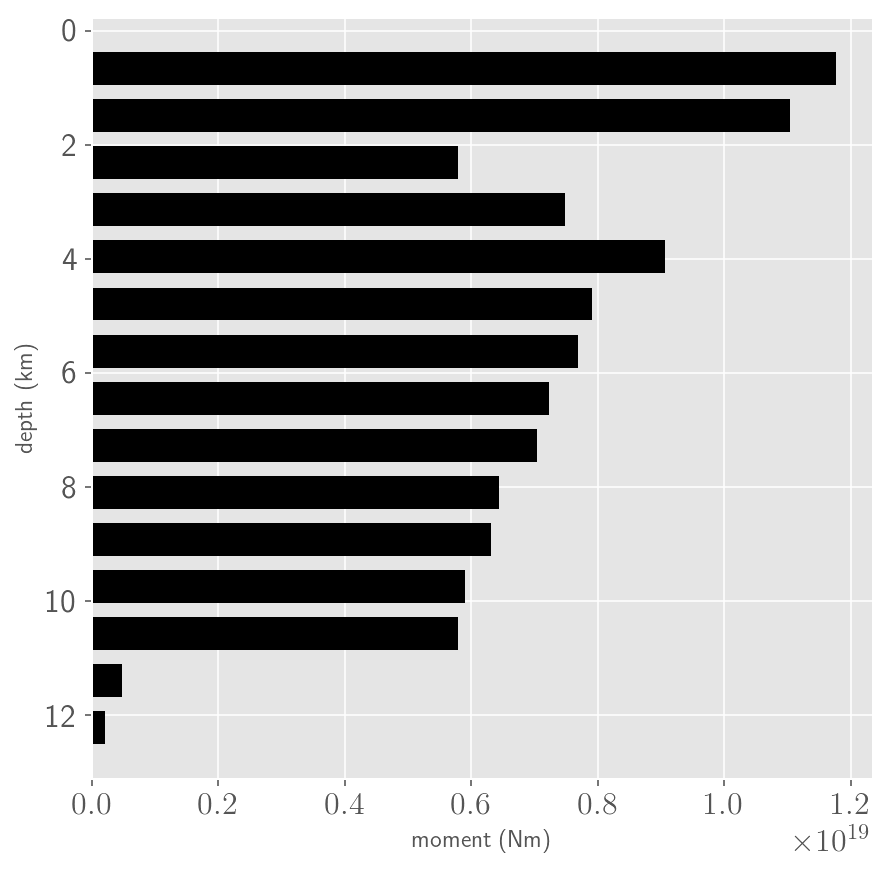

In [30]:
inverse_tools.plot_moment_analysis(tri_depth, avg_tri_moment)

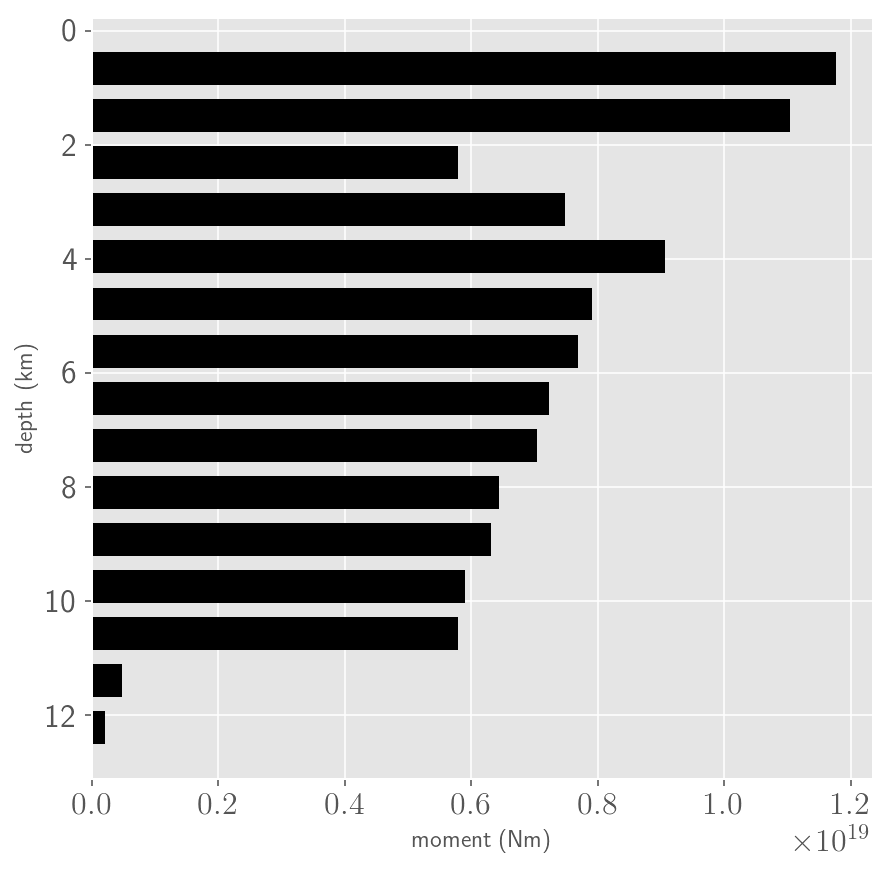

In [31]:
with plt.style.context('ggplot'):
    plt.figure(figsize = (7,7))
    plt.hist(
        -tri_depth / 1000.0, weights = avg_tri_moment,
        bins = 15, rwidth = 0.7,
        orientation = 'horizontal', color = 'k'
    )
    plt.ylabel('depth (km)')
    plt.xlabel('moment (Nm)')
    plt.gca().set_yticklabels([str(int(-d)) for d in plt.gca().get_yticks()])
    #plt.savefig('depth_vs_moment2.pdf')
    plt.show()

In [32]:
fialko05 = [(0.5, 0.55), (1.5, 0.87), (3.0, 1.0), (5.2, 0.91), (8.3, 0.82), (12, 0.79)]
def project(x, p1, p2):
    slope = (p2[1] - p1[1]) / (p2[0] - p1[0])
    return p2[1] + slope * (x - p2[0])
fialko05.insert(0, (0.0, project(0.0, fialko05[1], fialko05[0])))
fialko05.append((13, project(13, fialko05[-2], fialko05[-1])))
fialko05 = np.array(fialko05)

In [33]:
fialko05

array([[  0.        ,   0.39      ],
       [  0.5       ,   0.55      ],
       [  1.5       ,   0.87      ],
       [  3.        ,   1.        ],
       [  5.2       ,   0.91      ],
       [  8.3       ,   0.82      ],
       [ 12.        ,   0.79      ],
       [ 13.        ,   0.78189189]])

In [34]:
import scipy.interpolate
f = scipy.interpolate.interp1d(fialko05[:,0], fialko05[:,1], kind = 'linear')
print(np.min(tri_depth / 1000.0), np.max(tri_depth / 1000.0))
fialko_moment = f(tri_depth / 1000.0)
total_moment = np.sum(fialko_moment)
est_moment = 1.05072723192e+20
fialko_moment *= est_moment / total_moment

0.252812458844 12.6252148731


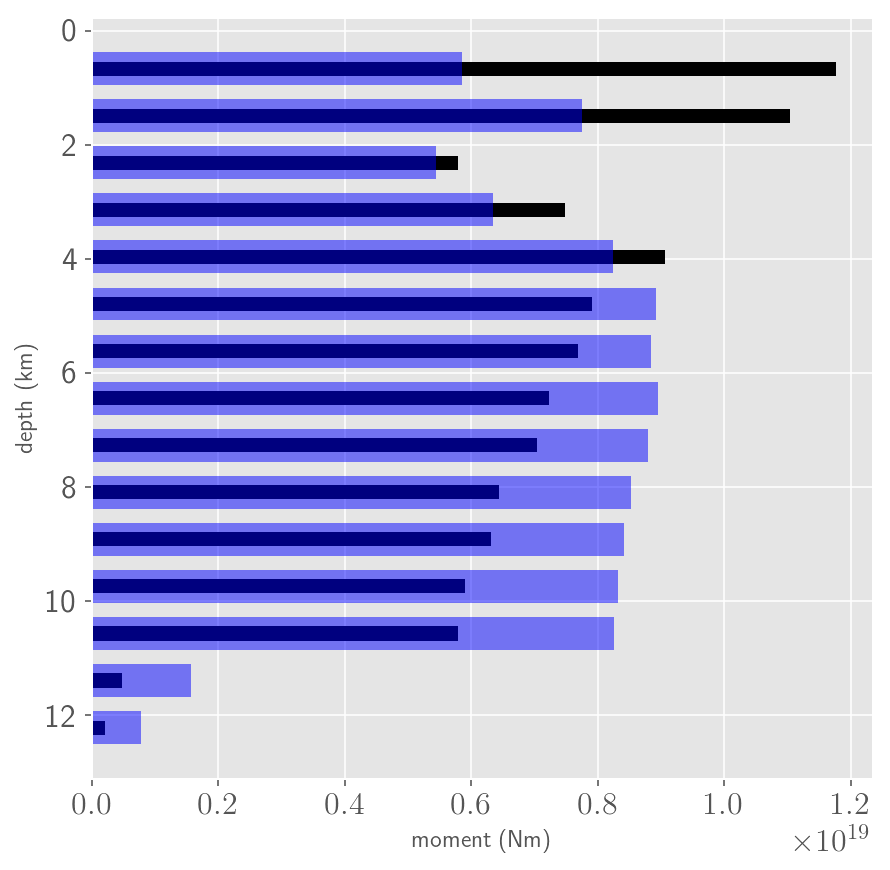

In [35]:
with plt.style.context('ggplot'):
    plt.figure(figsize = (7,7))
    plt.hist(
        -tri_depth / 1000.0, weights = avg_tri_moment ,
        bins = 15, rwidth = 0.3,
        orientation = 'horizontal', color = 'k'
    )
    plt.hist(
        -tri_depth / 1000.0, weights = fialko_moment,
        bins = 15, rwidth = 0.7,
        orientation = 'horizontal', color = (0,0,1,0.5)
    )
    plt.ylabel('depth (km)')
    plt.xlabel('moment (Nm)')
    plt.gca().set_yticklabels([str(int(-d)) for d in plt.gca().get_yticks()])
    plt.savefig('depth_vs_moment_with_fialko.pdf')
    plt.show()

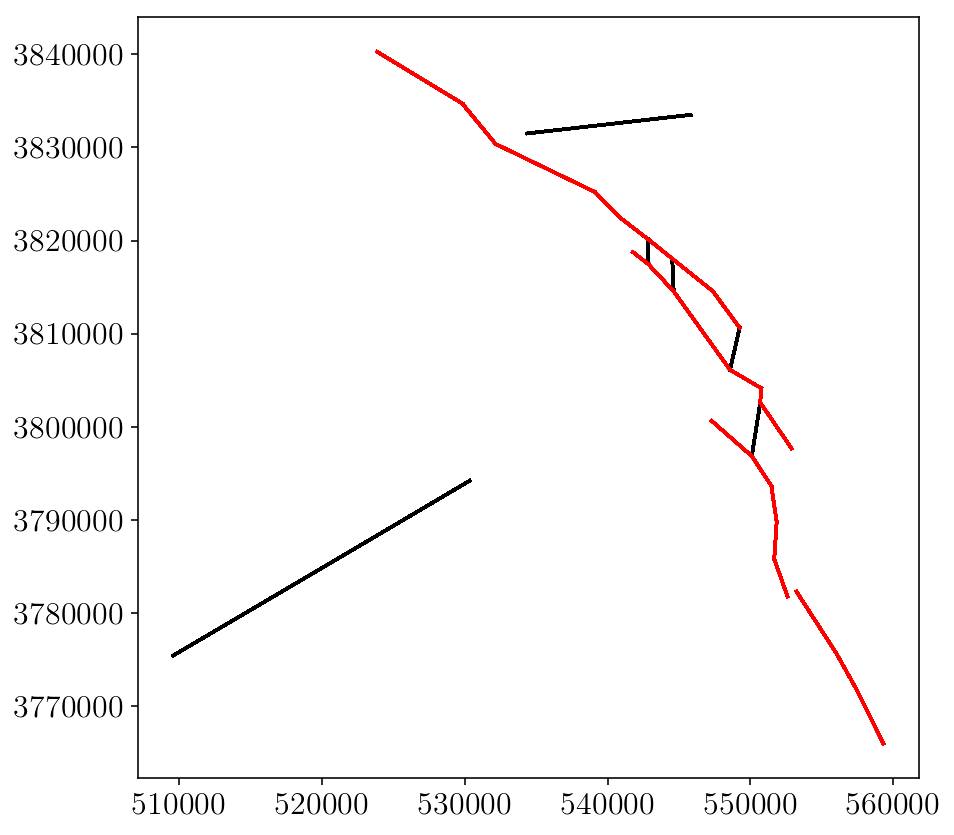

In [36]:
fault_tris = m_refined.get_tris('fault')
chunk_bounds = [('Emerson', 0,1536), ('Homestead Valley', 2016, 3072), ('Johnson Valley', 3264, 4896)]
start = 0
end = 9000
chunk = fault_tris[start:end]
plt.figure(figsize = (7,7))
plt.triplot(m_refined.pts[:,0], m_refined.pts[:,1], chunk, 'k-')
for c in chunk_bounds:
    plt.triplot(m_refined.pts[:,0], m_refined.pts[:,1], fault_tris[c[1]:c[2]], 'r-')
plt.show()

In [37]:
strike_slip = inverse_tools.get_vert_vals_linear(
    (m_refined.pts, m_refined.get_tris('fault')), 
    inverse_soln[0].reshape((-1,3,2))[:,:,0]
)
strike_slip /= 100. # centimeters to meters
strike_slip *= -1 #make right lateral positive

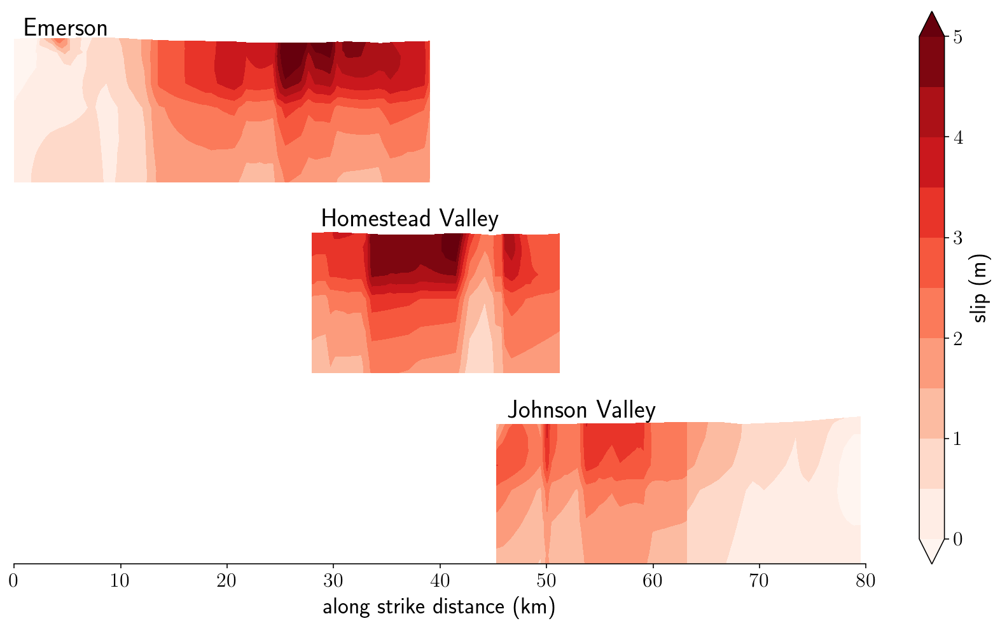

In [40]:
levels = np.linspace(0, 5, 11)
plt.figure(figsize = (15,8))
corner = None
for i, c in enumerate(chunk_bounds[:3]):
    if corner is None:
        min_corner = np.min(np.min(m_refined.get_tri_pts('fault')[c[1]:c[2],:,:], axis = 0), axis = 0)
        max_corner = np.max(np.max(m_refined.get_tri_pts('fault')[c[1]:c[2],:,:], axis = 0), axis = 0)
        corner1 = np.array([max_corner[0], min_corner[1]])
        corner2 = np.array([min_corner[0], max_corner[1]])
        corner = corner2
        vec = corner1 - corner2 
        vec /= np.linalg.norm(vec)
    
    horz = np.array([m_refined.pts[:,0], m_refined.pts[:,1]]).T
    strike_dist = (horz - corner).dot(vec)
    #strike_dist = np.sqrt(np.sum((horz - first_corner) ** 2, axis = 1))
    z = m_refined.pts[:,2] - i * 15000
    tris_chunk = m_refined.get_tris('fault')[c[1]:c[2]]
    cntf = plt.tricontourf(
        strike_dist / 1000.0, z / 1000.0, 
        tris_chunk, strike_slip, 
        levels = levels, extend = 'both', cmap = 'Reds'
    )
    x_text = np.min(strike_dist[np.unique(tris_chunk)]) / 1000.0
    plt.text(x_text + 1, 1.5 - i * 15, '$\\text{' + c[0] + '}$')

ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)    
    
cbar = plt.colorbar(cntf)
cbar.set_label('$\\text{slip (m)}$')
# fc, R = inverse_tools.get_fault_centered_view(m_refined)
# view_R = 0.8
plt.xlim([0, 80])
plt.xlabel('$\\text{along strike distance (km)}$')
plt.yticks([])

# plt.xlim([fC[sdim[0]] - view_R * R, fC[sdim[0]] + view_R * R])
# plt.ylim([fC[sdim[1]] - view_R * R / 4, fC[sdim[1]] + view_R * R / 4])
plt.savefig('landers_panels_continuous_old.pdf', bbox_inches = 'tight')
plt.show()